In [55]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/README.dataset.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/README.roboflow.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/data.yaml
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/valid/labels/332_jpg.rf.82572427506bb0314745efb56ffdbef7.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/valid/labels/539_jpg.rf.a48c85cb3d29efd40c05b75afaf3d733.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/valid/labels/782_jpg.rf.d085bc46ccccfd4cb2d23d498f38aea2.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/valid/labels/156_jpg.rf.5641c535b1ad00a956046413d887d707.txt
/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/valid/labels/671_jpg.rf.3e664cfb0e8e9c99db8216997badf0ae.txt
/kaggle/input/remote-sensing-s

In [56]:
image_dir = '/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/train/images'
label_dir = '/kaggle/input/remote-sensing-satellite-images/Remote Sensing Data.v2i.yolov8/train/labels'

In [57]:
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.jpg') or f.endswith('.png')])
label_files = sorted([f for f in os.listdir(label_dir) if f.endswith('.txt')])

In [58]:
image_paths = []
class_labels = []
center_x = []
center_y = []
width = []
height = []

for img, lbl in zip(image_files, label_files):
   
    img_path = os.path.join(image_dir, img)
    label_path = os.path.join(label_dir, lbl)

    with open(label_path, 'r') as file:
        for line in file:
           
            parts = line.strip().split()
            if len(parts) == 5:
               
                image_paths.append(img_path)
                class_labels.append(int(parts[0]))  
                center_x.append(float(parts[1]))
                center_y.append(float(parts[2]))
                width.append(float(parts[3]))
                height.append(float(parts[4]))

df = pd.DataFrame({
    'image_path': image_paths,
    'class_label': class_labels,
    'center_x': center_x,
    'center_y': center_y,
    'width': width,
    'height': height
})

In [59]:
df.head()

,image_path,class_label,center_x,center_y,width,height
0,/kaggle/input/remote-sensing-satellite-images/...,2,0.498437,0.498437,0.996094,0.996094
1,/kaggle/input/remote-sensing-satellite-images/...,10,0.510938,0.618750,0.970313,0.754687
2,/kaggle/input/remote-sensing-satellite-images/...,9,0.498437,0.498437,0.996094,0.996094
3,/kaggle/input/remote-sensing-satellite-images/...,4,0.498437,0.498437,0.996094,0.996094
4,/kaggle/input/remote-sensing-satellite-images/...,5,0.498437,0.498437,0.996094,0.996094


In [60]:
df.tail()

,image_path,class_label,center_x,center_y,width,height
743,/kaggle/input/remote-sensing-satellite-images/...,7,0.498437,0.498437,0.996094,0.996094
744,/kaggle/input/remote-sensing-satellite-images/...,3,0.498437,0.498437,0.996094,0.996094
745,/kaggle/input/remote-sensing-satellite-images/...,2,0.498437,0.498437,0.996094,0.996094
746,/kaggle/input/remote-sensing-satellite-images/...,3,0.182031,0.498437,0.364063,0.996094
747,/kaggle/input/remote-sensing-satellite-images/...,11,0.662500,0.498437,0.667969,0.996094


In [61]:
df.shape

(748, 6)

In [62]:
df.columns

Index(['image_path', 'class_label', 'center_x', 'center_y', 'width', 'height'], dtype='object')

In [63]:
df.duplicated().sum()

0

In [64]:
df.isnull().sum()

image_path     0
class_label    0
center_x       0
center_y       0
width          0
height         0
dtype: int64

In [65]:
df = df[['image_path', 'class_label']]

In [66]:
df

,image_path,class_label
0,/kaggle/input/remote-sensing-satellite-images/...,2
1,/kaggle/input/remote-sensing-satellite-images/...,10
2,/kaggle/input/remote-sensing-satellite-images/...,9
3,/kaggle/input/remote-sensing-satellite-images/...,4
4,/kaggle/input/remote-sensing-satellite-images/...,5
...,...,...
743,/kaggle/input/remote-sensing-satellite-images/...,7
744,/kaggle/input/remote-sensing-satellite-images/...,3
745,/kaggle/input/remote-sensing-satellite-images/...,2
746,/kaggle/input/remote-sensing-satellite-images/...,3


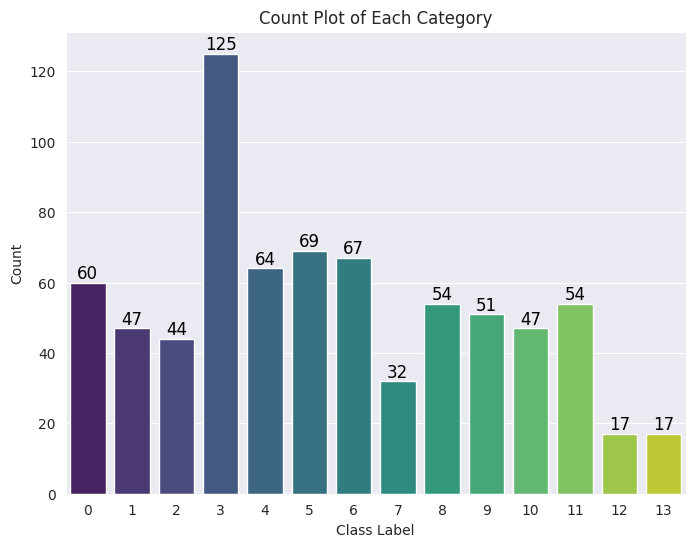

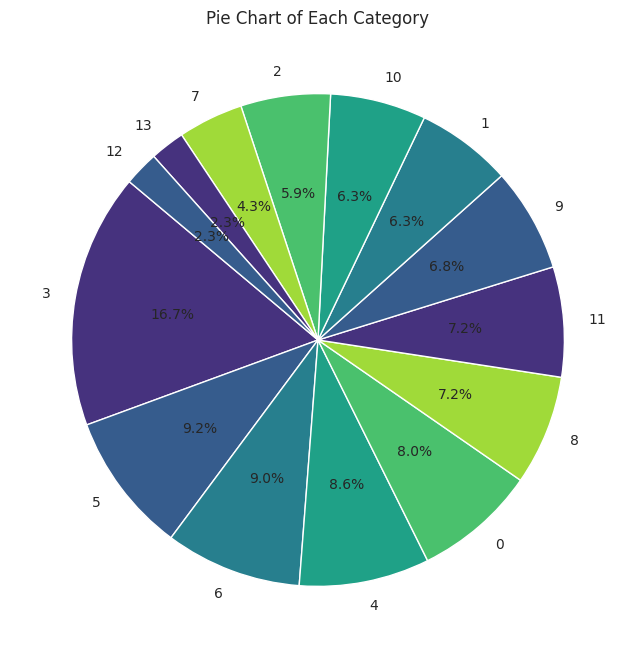

In [67]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(8, 6))
ax = sns.countplot(data=df, x='class_label', palette="viridis")
plt.title('Count Plot of Each Category')
plt.xlabel('Class Label')
plt.ylabel('Count')


for p in ax.patches:
    ax.annotate(f'{int(p.get_height())}', 
                (p.get_x() + p.get_width() / 2, p.get_height()), 
                ha='center', va='bottom', fontsize=12, color='black')

plt.show()

plt.figure(figsize=(8, 8))
class_counts = df['class_label'].value_counts()
plt.pie(class_counts, labels=class_counts.index, autopct='%1.1f%%', colors=sns.color_palette("viridis"), startangle=140)

plt.title('Pie Chart of Each Category')
plt.show()

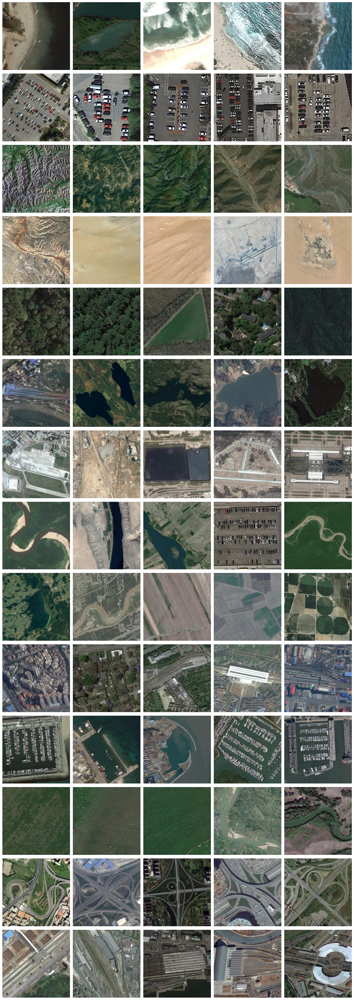

In [68]:
import random
from PIL import Image

images_per_category = 5

class_labels = df['class_label'].unique()

fig, axes = plt.subplots(len(class_labels), images_per_category, figsize=(15, 3 * len(class_labels)))

for i, class_label in enumerate(class_labels):

    class_images = df[df['class_label'] == class_label]['image_path'].tolist()
    
    sampled_images = random.sample(class_images, min(images_per_category, len(class_images)))
    
    for j, image_path in enumerate(sampled_images):
        img = Image.open(image_path)
        
        axes[i, j].imshow(img)
        axes[i, j].axis('off')
        
        if j == 0:
            axes[i, j].set_ylabel(f"Class {class_label}", rotation=0, labelpad=50, fontsize=12, ha='right', va='center')

plt.tight_layout()
plt.show()

In [69]:
from imblearn.over_sampling import RandomOverSampler

In [70]:
ros = RandomOverSampler(random_state=42)
X_resampled, y_resampled = ros.fit_resample(df[['image_path']], df['class_label'])

In [71]:
df_resampled = pd.DataFrame(X_resampled, columns=['image_path'])
df_resampled['class_label'] = y_resampled

In [72]:
print("\nClass distribution after oversampling:")
print(df_resampled['class_label'].value_counts())


Class distribution after oversampling:
class_label
2     125
10    125
9     125
4     125
5     125
8     125
1     125
13    125
0     125
3     125
11    125
6     125
7     125
12    125
Name: count, dtype: int64


In [73]:
df_resampled

,image_path,class_label
0,/kaggle/input/remote-sensing-satellite-images/...,2
1,/kaggle/input/remote-sensing-satellite-images/...,10
2,/kaggle/input/remote-sensing-satellite-images/...,9
3,/kaggle/input/remote-sensing-satellite-images/...,4
4,/kaggle/input/remote-sensing-satellite-images/...,5
...,...,...
1745,/kaggle/input/remote-sensing-satellite-images/...,13
1746,/kaggle/input/remote-sensing-satellite-images/...,13
1747,/kaggle/input/remote-sensing-satellite-images/...,13
1748,/kaggle/input/remote-sensing-satellite-images/...,13


In [74]:
import time
import shutil
import pathlib
import itertools
from PIL import Image

import cv2
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, classification_report

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam, Adamax
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras import regularizers

import warnings
warnings.filterwarnings("ignore")

print ('check')

check


In [75]:
df_resampled['class_label'] = df_resampled['class_label'].astype(str)

In [76]:
train_df_new, temp_df_new = train_test_split(
    df_resampled,
    train_size=0.8,  
    shuffle=True,
    random_state=42,
    stratify=df_resampled['class_label']  
)

valid_df_new, test_df_new = train_test_split(
    temp_df_new,
    test_size=0.5,  
    shuffle=True,
    random_state=42,
    stratify=temp_df_new['class_label'] 
)

In [77]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

batch_size = 16
img_size = (224, 224)
channels = 3  
img_shape = (img_size[0], img_size[1], channels)

tr_gen = ImageDataGenerator(rescale=1./255)  
ts_gen = ImageDataGenerator(rescale=1./255)

train_gen_new = tr_gen.flow_from_dataframe(
    train_df_new,
    x_col='image_path',  
    y_col='class_label',     
    target_size=img_size,
    class_mode='sparse',  
    color_mode='rgb', 
    shuffle=True,
    batch_size=batch_size
)

valid_gen_new = ts_gen.flow_from_dataframe(
    valid_df_new,
    x_col='image_path',  
    y_col='class_label',     
    target_size=img_size,
    class_mode='sparse',  
    color_mode='rgb', 
    shuffle=True,
    batch_size=batch_size
)

test_gen_new = ts_gen.flow_from_dataframe(
    test_df_new,
    x_col='image_path', 
    y_col='class_label',    
    target_size=img_size,
    class_mode='sparse',  
    color_mode='rgb', 
    shuffle=False,  
    batch_size=batch_size
)

Found 1400 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.
Found 175 validated image filenames belonging to 14 classes.


In [78]:
import tensorflow as tf
from tensorflow.keras import layers, models
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

In [79]:
physical_devices = tf.config.list_physical_devices('GPU')
if physical_devices:
    print("Using GPU")
else:
    print("Using CPU")

Using GPU


In [80]:
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)

In [81]:
from tensorflow.keras.applications import VGG16
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_vgg16_model(input_shape):
    
    inputs = Input(shape=input_shape)
    
    base_model = VGG16(weights='imagenet', input_tensor=inputs, include_top=False)
    
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 7, 7, 512 
    x = Reshape((height * width, channels))(x)  

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x) 

    attention_output = Reshape((height, width, channels))(attention_output)
    
    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_vgg16_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [82]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=5,  
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 23s 167ms/step - accuracy: 0.3485 - loss: 2.0396 - val_accuracy: 0.3886 - val_loss: 2.2730
Epoch 2/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.6384 - loss: 1.2135 - val_accuracy: 0.4914 - val_loss: 1.9934
Epoch 3/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - accuracy: 0.6936 - loss: 0.9943 - val_accuracy: 0.6800 - val_loss: 1.5046
Epoch 4/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 8s 91ms/step - accuracy: 0.7599 - loss: 0.7450 - val_accuracy: 0.6914 - val_loss: 1.1762
Epoch 5/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 8s 90ms/step - accuracy: 0.8017 - loss: 0.6267 - val_accuracy: 0.6629 - val_loss: 1.0204


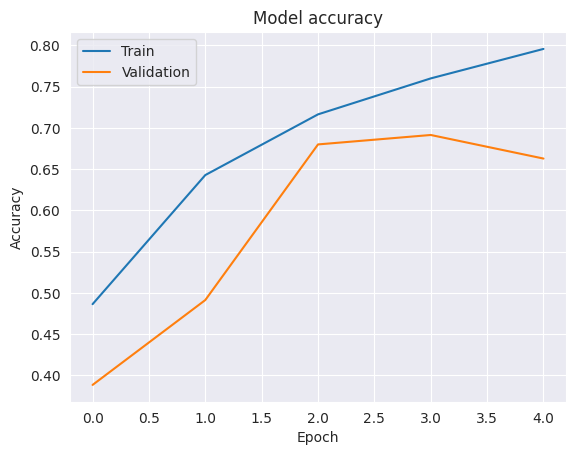

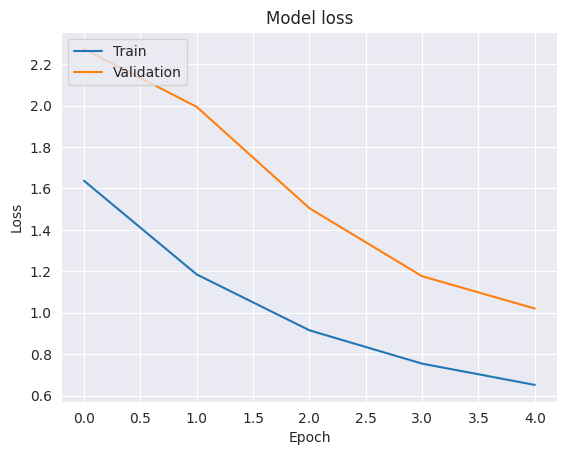

In [83]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [84]:
test_labels = test_gen_new.classes  
predictions = cnn_model.predict(test_gen_new)  
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 125ms/step


In [85]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       1.00      0.25      0.40        12
           1       0.79      0.85      0.81        13
          10       0.60      1.00      0.75        12
          11       0.77      0.77      0.77        13
          12       0.85      0.85      0.85        13
          13       0.50      0.58      0.54        12
           2       1.00      0.85      0.92        13
           3       1.00      0.38      0.56        13
           4       0.35      0.92      0.51        12
           5       0.75      0.50      0.60        12
           6       0.89      0.62      0.73        13
           7       0.92      1.00      0.96        12
           8       0.64      0.58      0.61        12
           9       0.80      0.62      0.70        13

    accuracy                           0.70       175
   macro avg       0.78      0.70      0.69       175
weighted avg       0.78      0.70      0.70       175



In [86]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

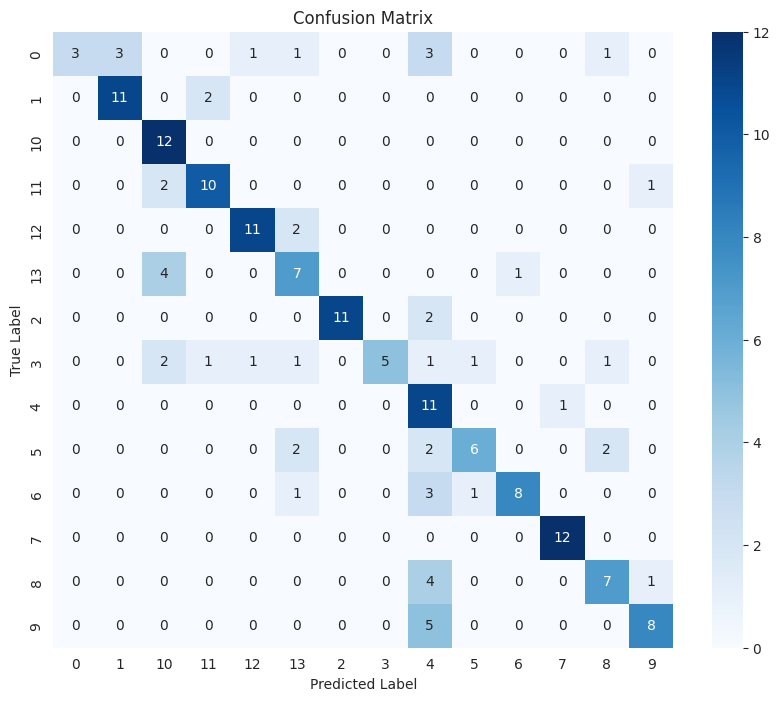

In [87]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [88]:
from tensorflow.keras.applications import VGG19
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_vgg19_model(input_shape):
    
    inputs = Input(shape=input_shape)
    
    base_model = VGG19(weights='imagenet', input_tensor=inputs, include_top=False)
    
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    
    height, width, channels = 7, 7, 512  
    x = Reshape((height * width, channels))(x)  

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x) 

    attention_output = Reshape((height, width, channels))(attention_output)
    
    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_vgg19_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [89]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=5,  
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 24s 179ms/step - accuracy: 0.3077 - loss: 2.1396 - val_accuracy: 0.2800 - val_loss: 2.3190
Epoch 2/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 9s 102ms/step - accuracy: 0.5888 - loss: 1.2940 - val_accuracy: 0.2743 - val_loss: 2.1177
Epoch 3/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 10s 105ms/step - accuracy: 0.6390 - loss: 1.1083 - val_accuracy: 0.4057 - val_loss: 1.7282
Epoch 4/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - accuracy: 0.7429 - loss: 0.8452 - val_accuracy: 0.5886 - val_loss: 1.3326
Epoch 5/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 10s 107ms/step - accuracy: 0.7924 - loss: 0.6552 - val_accuracy: 0.5829 - val_loss: 1.3261


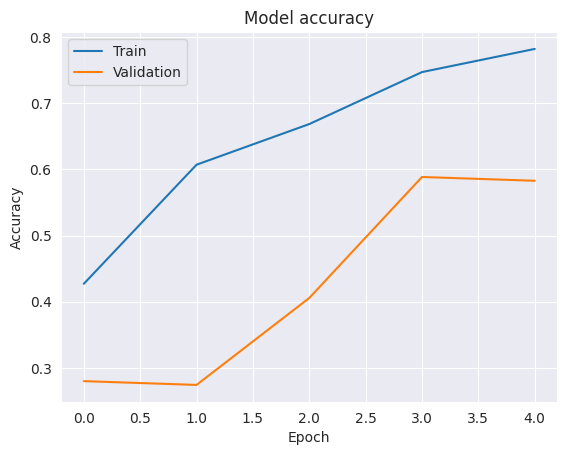

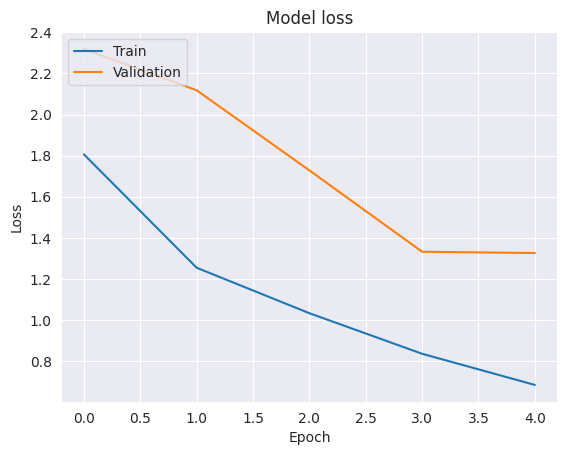

In [90]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [91]:
test_labels = test_gen_new.classes  
predictions = cnn_model.predict(test_gen_new)  
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 2s 142ms/step


In [92]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       1.00      0.42      0.59        12
           1       0.40      0.15      0.22        13
          10       0.45      0.42      0.43        12
          11       0.21      0.92      0.34        13
          12       0.67      0.15      0.25        13
          13       0.00      0.00      0.00        12
           2       1.00      0.08      0.14        13
           3       0.00      0.00      0.00        13
           4       0.00      0.00      0.00        12
           5       0.00      0.00      0.00        12
           6       0.00      0.00      0.00        13
           7       1.00      0.33      0.50        12
           8       0.13      0.83      0.22        12
           9       0.90      0.69      0.78        13

    accuracy                           0.29       175
   macro avg       0.41      0.29      0.25       175
weighted avg       0.41      0.29      0.25       175



In [93]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

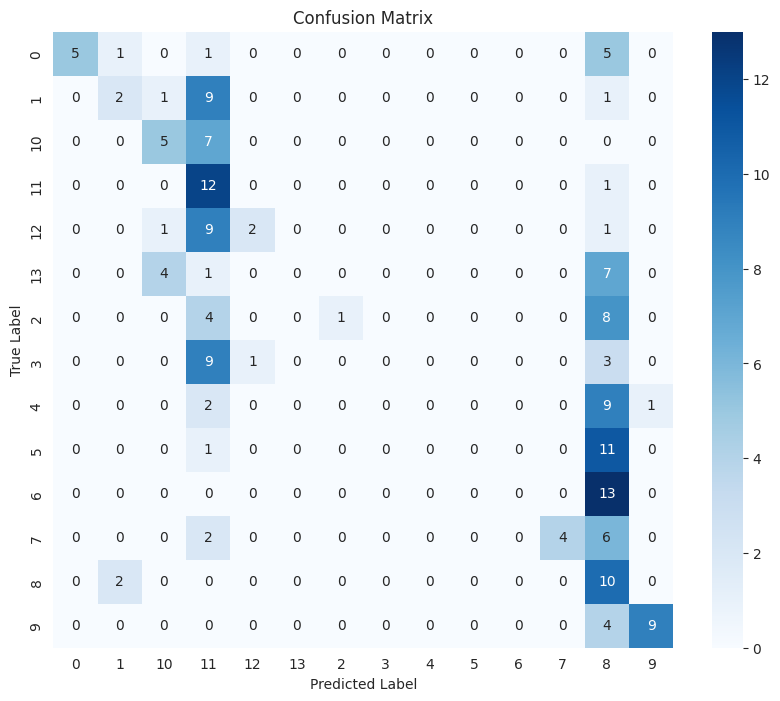

In [94]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [95]:
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_inceptionv3_model(input_shape):
    
    inputs = Input(shape=input_shape)
    
    base_model = InceptionV3(weights='imagenet', input_tensor=inputs, include_top=False)
    
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 5, 5, 2048  
    x = Reshape((height * width, channels))(x)  

    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x) 

    attention_output = Reshape((height, width, channels))(attention_output)
    
    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)

    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)

    outputs = Dense(14, activation='softmax')(x)

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_inceptionv3_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [96]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=5,  
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 48s 340ms/step - accuracy: 0.4807 - loss: 1.9312 - val_accuracy: 0.5657 - val_loss: 1.7963
Epoch 2/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - accuracy: 0.8081 - loss: 0.6570 - val_accuracy: 0.5886 - val_loss: 1.4472
Epoch 3/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - accuracy: 0.8700 - loss: 0.4519 - val_accuracy: 0.6629 - val_loss: 1.2109
Epoch 4/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 131ms/step - accuracy: 0.8957 - loss: 0.3675 - val_accuracy: 0.5314 - val_loss: 2.7913
Epoch 5/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 12s 129ms/step - accuracy: 0.9102 - loss: 0.3699 - val_accuracy: 0.4286 - val_loss: 3.7984


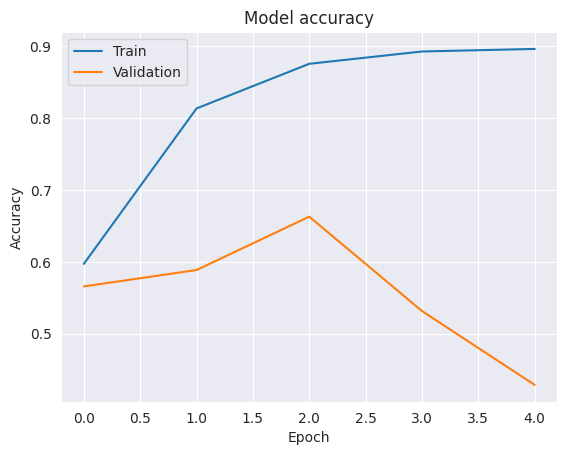

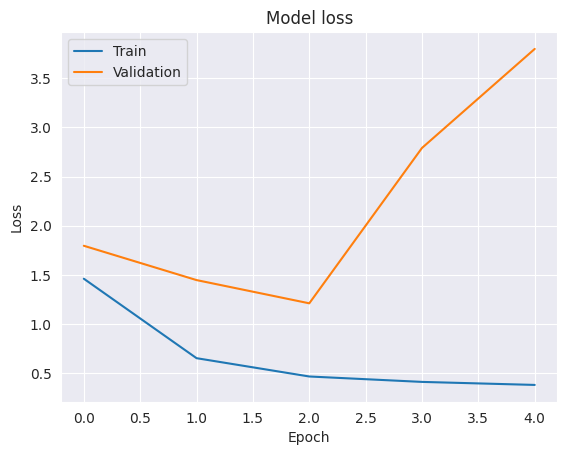

In [97]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [98]:
test_labels = test_gen_new.classes  
predictions = cnn_model.predict(test_gen_new)  
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 11s 570ms/step


In [99]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       1.00      0.08      0.15        12
           1       0.62      0.77      0.69        13
          10       0.79      0.92      0.85        12
          11       0.76      1.00      0.87        13
          12       0.88      0.54      0.67        13
          13       0.89      0.67      0.76        12
           2       0.33      1.00      0.49        13
           3       0.34      0.85      0.49        13
           4       1.00      0.08      0.15        12
           5       0.50      0.08      0.14        12
           6       0.86      0.46      0.60        13
           7       0.00      0.00      0.00        12
           8       0.50      0.42      0.45        12
           9       0.67      0.92      0.77        13

    accuracy                           0.57       175
   macro avg       0.65      0.56      0.51       175
weighted avg       0.65      0.57      0.51       175



In [100]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

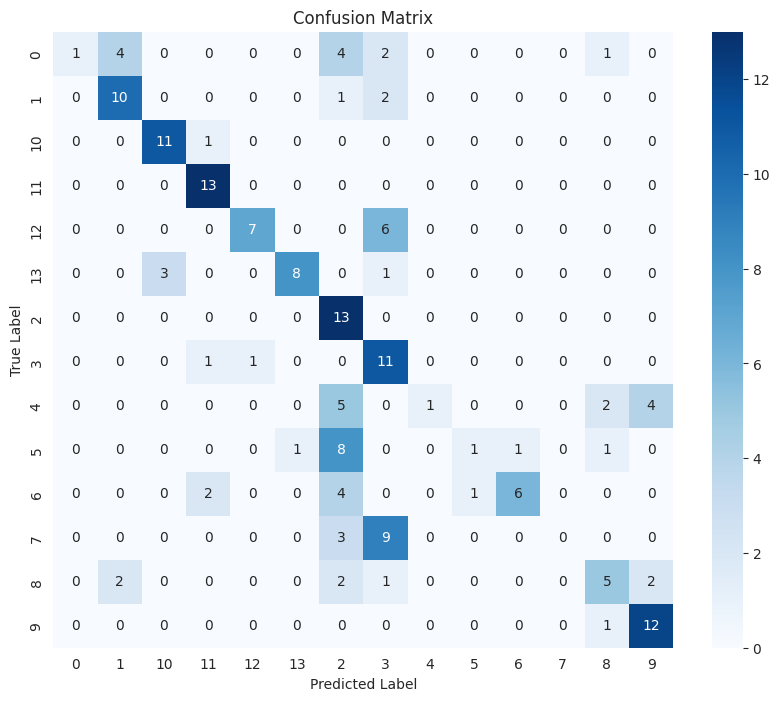

In [101]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [102]:
from tensorflow.keras.applications import Xception
from tensorflow.keras.models import Model
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense, Dropout, BatchNormalization, GaussianNoise, Input, MultiHeadAttention, Reshape
from tensorflow.keras.optimizers import Adam
import tensorflow as tf

def create_xception_model(input_shape):
    
    inputs = Input(shape=input_shape)
    
    base_model = Xception(weights='imagenet', input_tensor=inputs, include_top=False)
    
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output

    height, width, channels = 7, 7, 2048  
    x = Reshape((height * width, channels))(x)  
   
    attention_output = MultiHeadAttention(num_heads=8, key_dim=channels)(x, x) 

    attention_output = Reshape((height, width, channels))(attention_output)
    
    x = GaussianNoise(0.25)(attention_output)
    x = GlobalAveragePooling2D()(x)
    x = Dense(512, activation='relu')(x)
    x = BatchNormalization()(x)
    x = GaussianNoise(0.25)(x)
    x = Dropout(0.25)(x)
    outputs = Dense(14, activation='softmax')(x)  

    model = Model(inputs=inputs, outputs=outputs)

    return model

input_shape = (224, 224, 3)
cnn_model = create_xception_model(input_shape)

cnn_model.compile(optimizer=Adam(learning_rate=0.0001),
                  loss='sparse_categorical_crossentropy',
                  metrics=['accuracy'])

In [103]:
history = cnn_model.fit(
    train_gen_new,
    validation_data=valid_gen_new,
    epochs=5,  
    callbacks=[early_stopping],
    verbose=1
)

Epoch 1/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 43s 345ms/step - accuracy: 0.5023 - loss: 1.7452 - val_accuracy: 0.5200 - val_loss: 1.5167
Epoch 2/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 238ms/step - accuracy: 0.8033 - loss: 0.6875 - val_accuracy: 0.7600 - val_loss: 0.8965
Epoch 3/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 21s 232ms/step - accuracy: 0.8390 - loss: 0.5244 - val_accuracy: 0.8000 - val_loss: 0.7940
Epoch 4/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 20s 226ms/step - accuracy: 0.8884 - loss: 0.3722 - val_accuracy: 0.7714 - val_loss: 0.7607
Epoch 5/5
88/88 ━━━━━━━━━━━━━━━━━━━━ 20s 218ms/step - accuracy: 0.8929 - loss: 0.3921 - val_accuracy: 0.7657 - val_loss: 0.7880


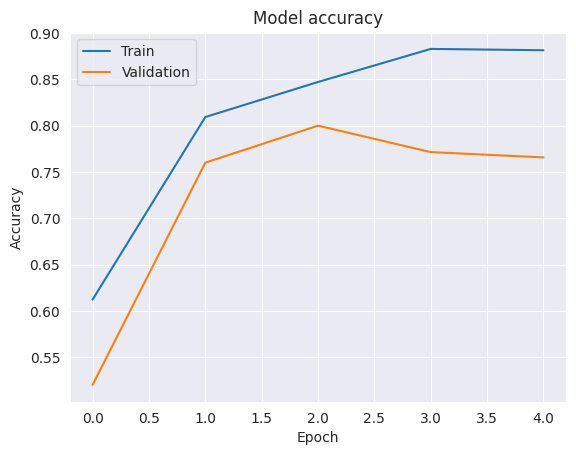

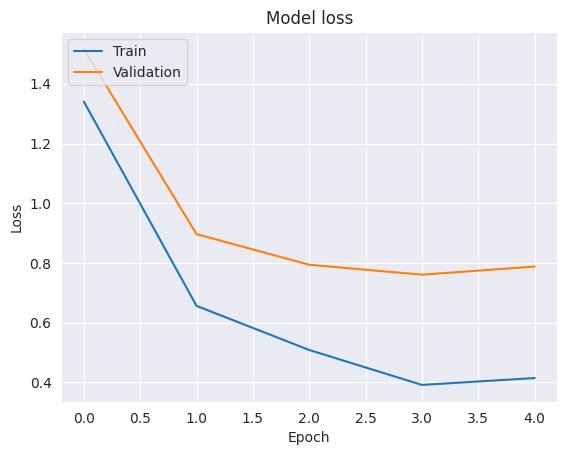

In [104]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [105]:
test_labels = test_gen_new.classes  
predictions = cnn_model.predict(test_gen_new)  
predicted_classes = np.argmax(predictions, axis=1)

11/11 ━━━━━━━━━━━━━━━━━━━━ 6s 335ms/step


In [106]:
report = classification_report(test_labels, predicted_classes, target_names=list(test_gen_new.class_indices.keys()))
print(report)

              precision    recall  f1-score   support

           0       0.75      0.75      0.75        12
           1       1.00      0.85      0.92        13
          10       0.79      0.92      0.85        12
          11       0.92      0.92      0.92        13
          12       1.00      1.00      1.00        13
          13       0.80      0.67      0.73        12
           2       1.00      1.00      1.00        13
           3       0.75      0.69      0.72        13
           4       1.00      0.67      0.80        12
           5       0.55      0.50      0.52        12
           6       0.46      0.92      0.62        13
           7       0.86      0.50      0.63        12
           8       0.75      0.50      0.60        12
           9       0.71      0.92      0.80        13

    accuracy                           0.78       175
   macro avg       0.81      0.77      0.78       175
weighted avg       0.81      0.78      0.78       175



In [107]:
conf_matrix = confusion_matrix(test_labels, predicted_classes)

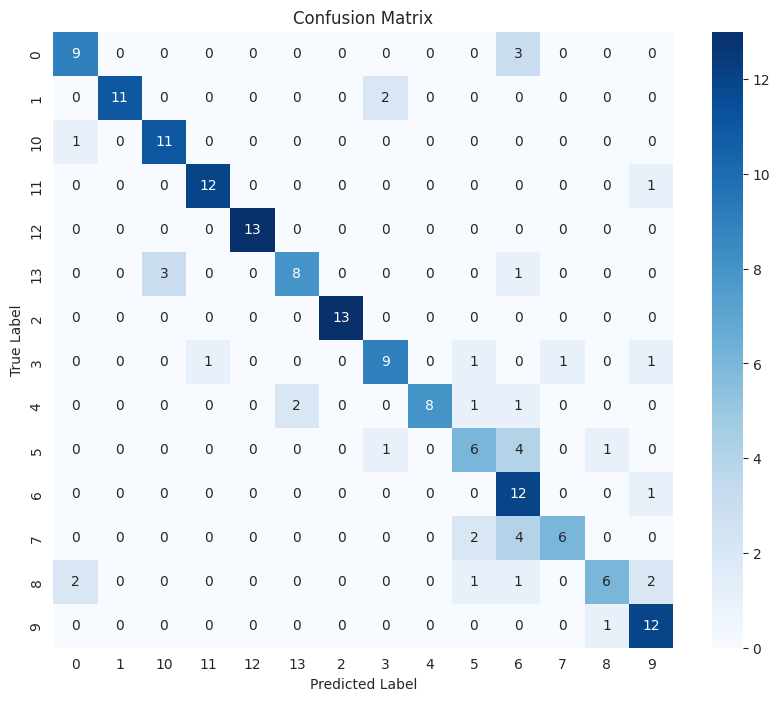

In [108]:
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=list(test_gen_new.class_indices.keys()), yticklabels=list(test_gen_new.class_indices.keys()))
plt.title('Confusion Matrix')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

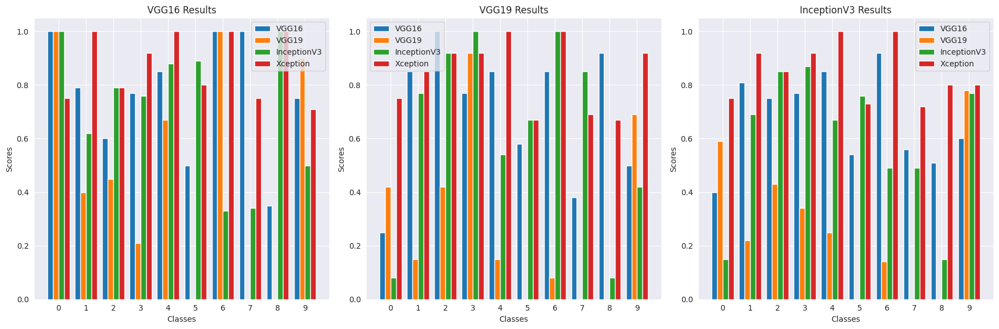

In [109]:
import matplotlib.pyplot as plt
import numpy as np

labels = [str(i) for i in range(10)]  

vgg16_precision = [1.00, 0.79, 0.60, 0.77, 0.85, 0.50, 1.00, 1.00, 0.35, 0.75]
vgg16_recall = [0.25, 0.85, 1.00, 0.77, 0.85, 0.58, 0.85, 0.38, 0.92, 0.50]
vgg16_f1 = [0.40, 0.81, 0.75, 0.77, 0.85, 0.54, 0.92, 0.56, 0.51, 0.60]

vgg19_precision = [1.00, 0.40, 0.45, 0.21, 0.67, 0.00, 1.00, 0.00, 0.00, 0.90]
vgg19_recall = [0.42, 0.15, 0.42, 0.92, 0.15, 0.00, 0.08, 0.00, 0.00, 0.69]
vgg19_f1 = [0.59, 0.22, 0.43, 0.34, 0.25, 0.00, 0.14, 0.00, 0.00, 0.78]

inceptionv3_precision = [1.00, 0.62, 0.79, 0.76, 0.88, 0.89, 0.33, 0.34, 1.00, 0.50]
inceptionv3_recall = [0.08, 0.77, 0.92, 1.00, 0.54, 0.67, 1.00, 0.85, 0.08, 0.42]
inceptionv3_f1 = [0.15, 0.69, 0.85, 0.87, 0.67, 0.76, 0.49, 0.49, 0.15, 0.77]

xception_precision = [0.75, 1.00, 0.79, 0.92, 1.00, 0.80, 1.00, 0.75, 1.00, 0.71]
xception_recall = [0.75, 0.85, 0.92, 0.92, 1.00, 0.67, 1.00, 0.69, 0.67, 0.92]
xception_f1 = [0.75, 0.92, 0.85, 0.92, 1.00, 0.73, 1.00, 0.72, 0.80, 0.80]

fig, ax = plt.subplots(1, 3, figsize=(18, 6))

models = ['VGG16', 'VGG19', 'InceptionV3', 'Xception']
precision_data = [vgg16_precision, vgg19_precision, inceptionv3_precision, xception_precision]
recall_data = [vgg16_recall, vgg19_recall, inceptionv3_recall, xception_recall]
f1_data = [vgg16_f1, vgg19_f1, inceptionv3_f1, xception_f1]

x = np.arange(len(labels)) 
width = 0.2 

for i, model in enumerate(models):
    ax[0].bar(x + i * width - 1.5 * width, precision_data[i], width, label=model)

for i, model in enumerate(models):
    ax[1].bar(x + i * width - 1.5 * width, recall_data[i], width, label=model)

for i, model in enumerate(models):
    ax[2].bar(x + i * width - 1.5 * width, f1_data[i], width, label=model)

for i in range(3):
    ax[i].set_xlabel('Classes')
    ax[i].set_ylabel('Scores')
    ax[i].set_title(f'{models[i]} Results')
    ax[i].set_xticks(x)
    ax[i].set_xticklabels(labels)
    ax[i].legend()

plt.tight_layout()
plt.show()

# Thanks !!!